# Data load & Utils

In [2]:
import torch

USE_CUDA = torch.cuda.is_available()
print(USE_CUDA)
device = torch.device('cuda:0' if USE_CUDA else 'cpu')
print('학습을 진행하는 기기:',device)
print('cuda index:', torch.cuda.current_device())
print('gpu 개수:', torch.cuda.device_count())
print('graphic name:', torch.cuda.get_device_name())

ModuleNotFoundError: No module named 'torch'

In [8]:
%cd C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/yolov5
!pip install -r requirements.txt

C:\Users\Jaesoon\OneDrive\Desktop\대학\s-hero\yolov5


In [12]:
from glob import glob
train_image_list = sorted(glob('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images/*.jpg'))
valid_image_list = sorted(glob('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/valid/images/*.jpg'))
train_annotations_list = sorted(glob('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/labels/*.txt'))
valid_annotations_list = sorted(glob('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/valid/labels/*.txt'))

assert len(train_image_list) == len(train_annotations_list), "train 이미지 파일의 수와 annotation 파일의 수가 맞지 않습니다."
assert len(valid_image_list) == len(valid_annotations_list), "valid 이미지 파일의 수와 annotation 파일의 수가 맞지 않습니다."
print(len(train_image_list), len(valid_image_list))

22 8


In [13]:
train_image_list

['C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\A1.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\A2.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\A3.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\A5.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\A6.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\A8.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\A9.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\B1.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\B2.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\B3.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\B5.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\B6.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images\\B8.jpg',
 'C:/Users/Jaesoon/OneDrive/Desktop/대학

In [2]:
sample_image_path = train_image_list[5]
sample_annot_path = train_annotations_list[5]

In [3]:
with open(sample_annot_path, 'r') as txt:
  strings = txt.readline()
  list_str = strings.split()  # str을 공란으로 쪼갬
  print(list_str)

['2', '0.523438', '0.472222', '0.392188', '0.338889']


In [4]:
#  annotation txt file로부터 ground truth logit 반환 
from pathlib import Path

def get_gt_logit(txt_path):
  txt_path = Path(txt_path)
  with open(txt_path, 'r') as txt:
    string = txt.readline()
    list_str = string.split()
    gt_logit = int(list_str[0])

  return gt_logit

In [5]:
sample_logit = get_gt_logit(sample_annot_path)
print(sample_logit)

2


In [6]:
open('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/data3.yaml', 'r',encoding='utf-8')

<_io.TextIOWrapper name='C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/data3.yaml' mode='r' encoding='utf-8'>

In [7]:
# annotation file 을 넣어서 logit과 class name의 dict 반환
import yaml

label_dict = {}

with open('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/data3.yaml', 'r',encoding='utf-8') as f:
    data = yaml.load(f, Loader=yaml.FullLoader)
    class_list = data['names']

    for idx in range(len(class_list)):
        name = class_list[idx]
        label_dict[idx] = name
print(label_dict)

{0: 'A_Normal', 1: 'A_Missing_part', 2: 'A_Misordered', 3: 'B_Normal', 4: 'B_Missing_part', 5: 'B_Misordered', 6: 'C_Normal', 7: 'C_Missing_part'}


In [8]:
# gt logit을 넣으면 gt name을 반환 
def logit2name(gt_logit):  # input : annotations txt file들의 list
  label_dict = {}
  with open('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/data3.yaml', 'r',encoding='utf-8') as f:
    data = yaml.load(f, Loader=yaml.FullLoader)
    class_list = data['names']

    for idx in range(len(class_list)):
      name = class_list[idx]
      label_dict[idx] = name

    gt_name = label_dict[gt_logit]
    return gt_name

In [9]:
print(logit2name(sample_logit))

A_Misordered


In [10]:
# annotation txt file path로부터 bbox 좌표 검출 
def get_bbox(annot_path):
  txt_path = Path(annot_path)
  with open(txt_path, 'r') as txt:
    string = txt.readline()
    list_str = string.split()
    x, y, w, h = list_str[1:5]
    
  return x, y, w, h 

In [11]:
x, y, w, h = get_bbox(sample_annot_path)
print(x, y, w, h)

0.523438 0.472222 0.392188 0.338889


# Dataset & Augmentation
## TODO

In [ ]:
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
  
    x, y, w, h = bbox
    x_min, x_max, y_min, y_max = int(x - w/2), int(x + w/2), int(y - h/2), int(y_min + h)
   
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

In [36]:
# ignore warnings 
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")

plt.ion()   # 반응형 모드

# Defining transform
## using torchvision

In [37]:
from torchvision import transforms
import numpy as np
from PIL import Image
import os
from pathlib import Path

def Mytransform (size=224, use_resizecrop = True, use_flip = True, use_color_jitter = False, use_gray_scale = False, use_normalize = False):
    resize_crop = transforms.RandomResizedCrop(size=size)
    horizontal_flip = transforms.RandomHorizontalFlip(p=0.5)
    color_jitter = transforms.RandomApply([
        transforms.ColorJitter(0.8, 0.8, 0.8, 0.2)
    ], p=0.8)
    gray_scale = transforms.RandomGrayscale(p=0.2)
    normalize = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    to_tensor = transforms.ToTensor()
    
    transforms_array = np.array([resize_crop, horizontal_flip, color_jitter, gray_scale, to_tensor, normalize])
    transforms_mask = np.array([use_resizecrop, use_flip, use_color_jitter, use_gray_scale, True, use_normalize])
    transform = transforms.Compose(transforms_array[transforms_mask])

    return transform

## using albumentations

In [ ]:
sample_image = cv2.imread

In [41]:
pip install --user albumentations

  Using cached albumentations-1.0.3-py3-none-any.whl (98 kB)
  Using cached opencv_python_headless-4.5.3.56-cp38-cp38-win_amd64.whl (34.8 MB)
Note: you may need to restart the kernel to use updated packages.


In [37]:
import albumentations as A
import albumentations.pytorch as AP
import cv2

transform = A.Compose([
        A.Resize(416, 416),                   
        A.RandomResizedCrop(height=300,
                            width=300,
                            scale=(0.5, 1.0), 
                            ratio=(0.75, 1.25), 
                            interpolation=1, 
                            always_apply=False, 
                            p=0.5),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.Affine(rotate=(-180, 180),
                shear=(-45, 45),
                p=0.5),
        A.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
        AP.ToTensorV2()
        ]
        ,bbox_params = A.BboxParams(format='yolo', min_area=1024, min_visibility=0.3))

In [1]:
def bbox_save(tran_bbox):
    xmina=tran_bbox[0][0]
    ymina=tran_bbox[0][1]
    xmaxa=tran_bbox[0][2]
    ymaxa=tran_bbox[0][3]
    x=str((xmina+xmaxa)/2)
    y=str((ymina+ymaxa)/2)
    w=str((xmaxa-xmina))
    h=str(ymaxa-ymina)
    cla=tran_bbox[0][4]
    list_complete=[cla,x,y,w,h]
    return list_complete

In [38]:
image2=cv2.imread(train_image_list[0])

In [14]:
import albumentations as A
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import numpy as np

image = plt.imread('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images/A5.jpg')
with open('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/labels/A5.txt', 'r') as txt:
  strings = txt.readline()
  list_str = strings.split()
x=float(list_str[1])
y=float(list_str[2])
w=float(list_str[3])
h=float(list_str[4])
xmin, xmax, ymin, ymax = (x - w/2), (x + w/2), (y - h/2), (y + h/2)
bbox = [[xmin, ymin, xmax, ymax, list_str[0]]]

transform = A.Compose([
    A.HorizontalFlip(p=1),
], bbox_params=A.BboxParams(format='pascal_voc'))

transformed = transform(image=image, bboxes=bbox)
transformed_image = transformed['image']
transformed_bboxes = transformed['bboxes']

plt.imsave('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/augmentation/images/A5_beautiful.jpg',transformed_image)


#cv2.imwrite('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/augmentation/images/A5_aug2g.jpg',transformed_image)


In [57]:
test_list=bbox_save(transformed_bboxes)

In [58]:
test_list

['1',
 '1919.4941410000001',
 '0.488889',
 '0.38984400000003916',
 '0.34166699999999994']

In [59]:
import pickle

filePath = 'C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/augmentation/labels/A5_aug.txt'

with open(filePath, 'wb') as lf:
    pickle.dump(test_list, lf)

In [60]:
with open(filePath, 'rb') as lf:
    readList = pickle.load(lf)
    print(readList)

['1', '1919.4941410000001', '0.488889', '0.38984400000003916', '0.34166699999999994']


## using imgaug

In [41]:
import cv2
import numpy as np
import imgaug as ia
import imgaug.augmenters as iaa

img = cv2.imread('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/images/A5.jpg',cv2.IMREAD_UNCHANGED)
with open('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/labels/A5.txt', 'r') as txt:
  strings = txt.readline()
  list_str = strings.split()
 
input_img = img[np.newaxis, :, :, :]
bbox = [ia.BoundingBox(x1 = float(list_str[1]), y1 = float(list_str[2]), 
x2 =float(list_str[1])+float(list_str[3]), y2 = float(list_str[3])+float(list_str[4]))]

seq = iaa.Sequential([
    iaa.Multiply((1.2, 1.5)),
    iaa.Affine(
        scale = (0.5, 0.7),
        rotate = 45)])
aug_img, aug_bbox = seq(images =input_img, bounding_boxes = bbox)
draw= aug_bbox[0].draw_on_image(aug_img[0], size = 2, color = [0,0,255])
cv2.imwrite('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/train/augmentation/images/A5_aug.jpg',draw)

TypeError: 'NoneType' object is not subscriptable

In [ ]:
import cv2
import numpy as np
import imgaug as ia
import imgaug.augmenters as iaa

images=[]
for image_path in train_image_list:
    img=cv2.imread(image_path,cv2.IMREAD_UNCHANGED)
    input_img = img[np.newaxis, :, :, :]
    images.append(input_img)

annotations=[]
for ann_path in train_annotations_list:
    with open(ann_path, 'r') as txt:
    strings = txt.readline()
    list_str = strings.split()
    annotations.append(list_str)

bbox = [ia.BoundingBox(x1 = float(list_str[1]), y1 = float(list_str[2]), 
x2 =float(list_str[1])+float(list_str[3]), y2 = float(list_str[3])+float(list_str[4]))]

seq = iaa.Sequential([
    iaa.Multiply((1.2, 1.5)),
    iaa.Affine(
        scale = (0.5, 0.7),
        rotate = 45)])
aug_img, aug_bbox = seq(images =input_img, bounding_boxes = bbox)
draw= aug_bbox[0].draw_on_image(aug_img[0], size = 2, color = [0,0,255])

In [14]:
aug_bbox

[BoundingBox(x1=770.1955, y1=-137.0599, x2=770.4812, y2=-136.7742, label=None)]

In [9]:
draw = output_bbox[0].draw_on_image(output_img[0], size = 2, color = [0,0,255])
res = np.hstack((img, draw))
cv2.imshow(res)

error: OpenCV(4.5.3) :-1: error: (-5:Bad argument) in function 'imshow'
> Overload resolution failed:
>  - imshow() missing required argument 'mat' (pos 2)
>  - imshow() missing required argument 'mat' (pos 2)
>  - imshow() missing required argument 'mat' (pos 2)


In [74]:
cv2.imshow(output_bbox)

error: OpenCV(4.5.3) :-1: error: (-5:Bad argument) in function 'imshow'
> Overload resolution failed:
>  - imshow() missing required argument 'mat' (pos 2)
>  - imshow() missing required argument 'mat' (pos 2)
>  - imshow() missing required argument 'mat' (pos 2)


In [19]:
import cv2
import numpy as np

image = cv2.imread("C:/Users/user/Drive/s-hero/code/train/images/A5.jpg",cv2.IMREAD_UNCHANGED)
cv2.imshow(image)

error: OpenCV(4.5.3) :-1: error: (-5:Bad argument) in function 'imshow'
> Overload resolution failed:
>  - imshow() missing required argument 'mat' (pos 2)
>  - imshow() missing required argument 'mat' (pos 2)
>  - imshow() missing required argument 'mat' (pos 2)


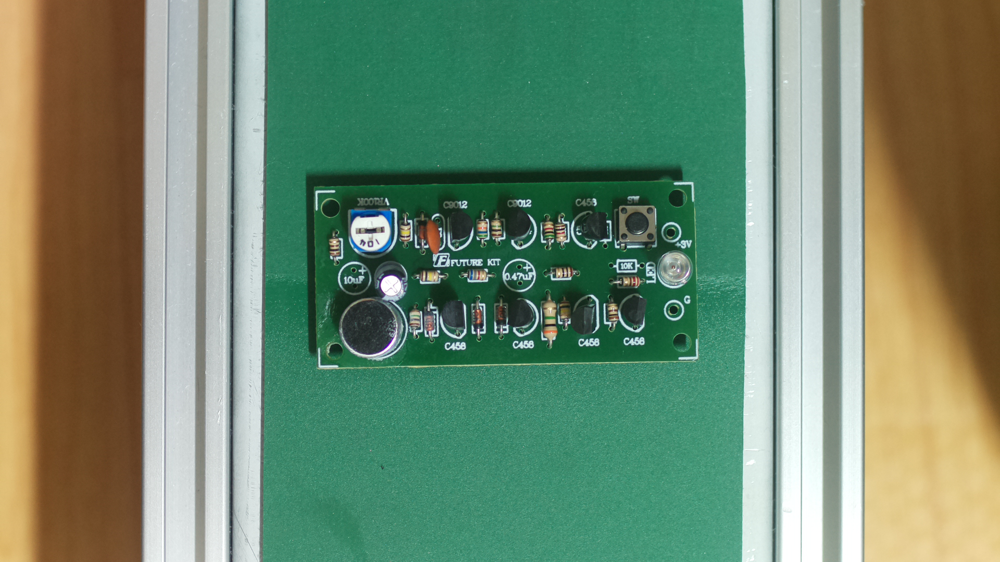

In [17]:
from PIL import Image
Image.open('C:/Users/user/Drive/s-hero/code/train/images/A5.jpg')

## Define Dataset Class

In [ ]:
# Dataset 정의
import os
import pandas as pd
import torch
from PIL import Image
from torch.utils.data import Dataset
from skimage import io
from pathlib import Path

class Mydataset(Dataset):
  # root = '/content/
  def __init__(self, root, mode = 'train', transform = None):
    self.root = os.path.join(root, mode)
    self.images = sorted(glob(self.root + '/images/*.jpg'))
    self.annotations = sorted(glob(self.root + '/labels/*.txt'))

  def __len__(self):
    assert len(self.images) == len(self.annotations), "이미지 파일의 수와 annotation 파일의 수가 맞지 않습니다."
    return len(self.annotations) 

  # annotation txt 파일 안에 있는 정답 클래스 정보 찾기
  def get_ground_truth(self, txt_file):
    txt_file = Path(txt_file)
    with open(txt_file, 'r') as f:
       annotation = txt_file.load(f)
    
    gt_class = annotation['regions'][0]['class'] 
    return gt_class

  def __getitem__(self, idx): # dataset중에 이미지 혹은 레이블을 하나씩 불러오는 함수 
    images = self.images[idx]
    image = Image.open(image)
    img_w, img_h = image.size
    annotation = self.annotations[idx]
    label = self.get_ground_truth(annotation)

    if self.transform:
      image = self.transform(image)
    return image, label

    

In [ ]:
from torch.utils.data import DataLoader
root = '/content'
transform = Mytransform()
train_dataset = Mydataset(root = root, mode = 'train')
train_dataloader = DataLoader(train_dataset, batch_size = 64, shuffle = True) # To be modified
val_dataset = Mydataset(root = root, mode = 'valid', transform = transform)
val_dataloader = DataLoader(val_dataset, batch_size = 64, shuffle = True)

# Training

In [ ]:
 '''
 hsv_h: 0.015  # image HSV-Hue augmentation (fraction) 
 hsv_s: 0.7  # image HSV-Saturation augmentation (fraction) 
 hsv_v: 0.4  # image HSV-Value augmentation (fraction) 
 degrees: 0.0  # image rotation (+/- deg) 
 translate: 0.1  # image translation (+/- fraction) 
 scale: 0.5  # image scale (+/- gain) 
 shear: 0.0  # image shear (+/- deg) 
 perspective: 0.0  # image perspective (+/- fraction), range 0-0.001 
 flipud: 0.0  # image flip up-down (probability) 
 fliplr: 0.5  # image flip left-right (probability) 
 mosaic: 1.0  # image mosaic (probability) 
 mixup: 0.0  # image mixup (probability) 


In [8]:
import codecs 
f = codecs.open("C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/yolov5/data.yaml", "r", "utf-8")
#a = open('C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/yolov5/data.yaml', 'rt', encoding='UTF8')

In [21]:
%cd C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/yolov5
!python train.py --img 416 --batch 16 --epochs 50 --data C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/data3.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name js_yolov5s_results

C:\Users\Jaesoon\OneDrive\Desktop\대학\s-hero\code\yolov5


YOLOv5  e866253 torch 1.9.0+cpu CPU

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, shear=0.0, perspective=0.0, flipud=0.0, fliplr=0.5, mosaic=1.0, mixup=0.0, copy_paste=0.0
TensorBoard: Start with 'tensorboard --logdir runs\train', view at http://localhost:6006/
2021-08-31 21:12:01.846249: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'cudart64_110.dll'; dlerror: cudart64_110.dll not found
2021-08-31 21:12:01.846277: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.

  0%|          | 0.00/41.1M [00:00<?, ?B/s]
  1%|          | 248k/41.1M [00:00<00:17, 2.43MB/s]
  4%|▍         | 1.77M/41.1M [00:00<00:10, 3.75MB/s

train: weights=yolov5m.pt, cfg=./models/yolov5m.yaml, data=C:/Users/Jaesoon/OneDrive/Desktop/대학/s-hero/code/data3.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=results_naive_m_32b_300e, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1, freeze=0, patience=30
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
Weights & Biases: run 'pip install wandb' to automatically track and visualize YOLOv5  runs (RECOMMENDED)

Plotting labels... 

autoanchor: Analyzing anchors... anchors/target = 4.73, Best Possible Recall (BPR) = 1.0000
                 all          7   

In [54]:
%load_ext tensorboard
%tensorboard --logdir /home/wnstnc0120/바탕화면/shero/yolov5/runs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 13867), started 0:40:56 ago. (Use '!kill 13867' to kill it.)

detect: weights=['/home/wnstnc0120/바탕화면/shero/yolov5/runs/train/results_naive_m_32b_500e/weights/best.pt'], source=/home/wnstnc0120/바탕화면/shero/valid/images/B10.jpg, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, tfl_int8=False
YOLOv5 🚀 v5.0-374-g1d65e81 torch 1.7.1 CUDA:0 (GeForce RTX 2080 Ti, 11016.3125MB)

Fusing layers... 
Model Summary: 308 layers, 21065925 parameters, 0 gradients, 50.4 GFLOPs
image 1/1 /home/wnstnc0120/바탕화면/shero/valid/images/B10.jpg: 256x416 Done. (0.030s)
Results saved to runs/detect/exp3
Done. (0.099s)


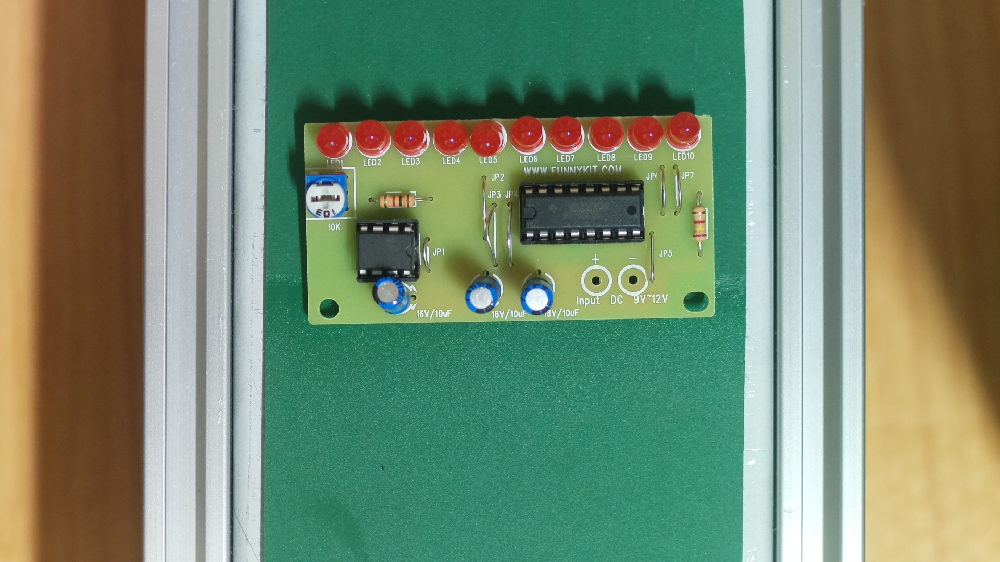

In [61]:
# Train 후 Inference 진행

from IPython.display import Image
import os

sample = valid_image_list[3]

!python detect.py --weights /home/wnstnc0120/바탕화면/shero/yolov5/runs/train/results_naive_m_32b_500e/weights/best.pt --img 416 --conf 0.5 --source "{sample}"
Image(os.path.join('/home/wnstnc0120/바탕화면/shero/yolov5/runs/detect/exp 2', os.path.basename(sample)))